- Import required functions:

In [2]:
from sahi.slicing import slice_coco
from sahi.utils.file import load_json

from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# 1. Divide the COCO annotated dataset into grids
-- 将已有annotation的图片和label展示出来并且切成小图以及对应的annotation文件
## 展示数据--绘制mask到图片中

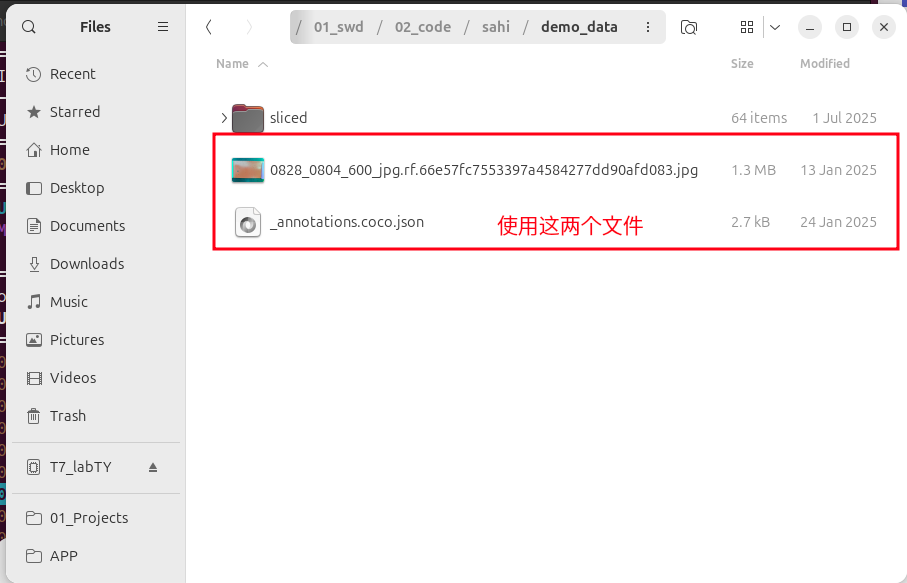
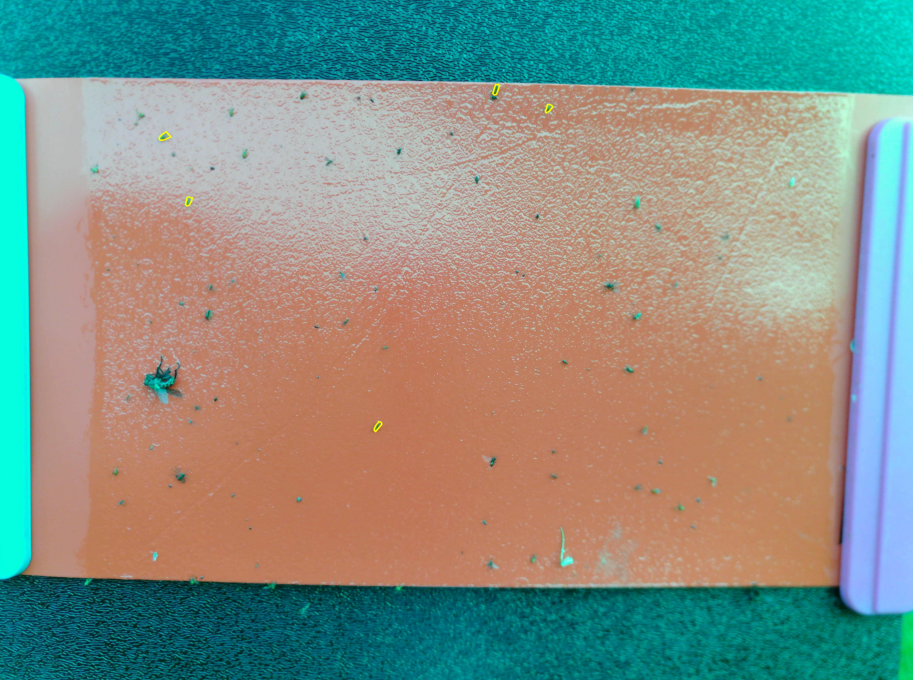

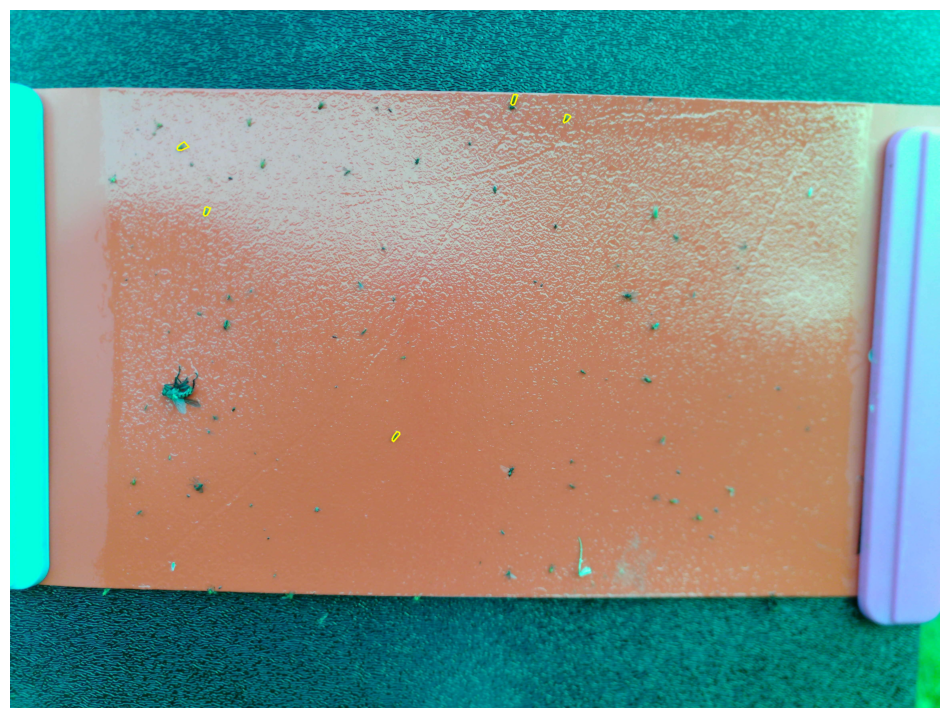

In [ ]:
coco_dict = load_json("demo_data/_annotations.coco.json")  # load COCO json

f, axarr = plt.subplots(1, 1, figsize=(12, 12))
# read image
img_ind = 0
img = Image.open("demo_data/" + coco_dict["images"][img_ind]["file_name"]).convert('RGBA')  # load image
draw = ImageDraw.Draw(img, 'RGBA')  # 创建绘图对象

# iterate over all annotations
for ann_ind in range(len(coco_dict["annotations"])):
    if "segmentation" in coco_dict["annotations"][ann_ind]:
        for seg in coco_dict["annotations"][ann_ind]["segmentation"]:
            # segmentation 是点的列表，需转换为整数坐标
            polygon = [(int(seg[i]), int(seg[i + 1])) for i in range(0, len(seg), 2)]
            draw.polygon(polygon, outline=(255, 255, 0, 255), width=8)  # 红色多边形
axarr.axis('off')  # 去除坐标轴
axarr.imshow(img)

## 要对COCO数据集的图像标注进行分片处理，我们需要指定分片参数。在此示例中，我们将图像分割为640x640的网格，重叠率为0.2

完成效果：

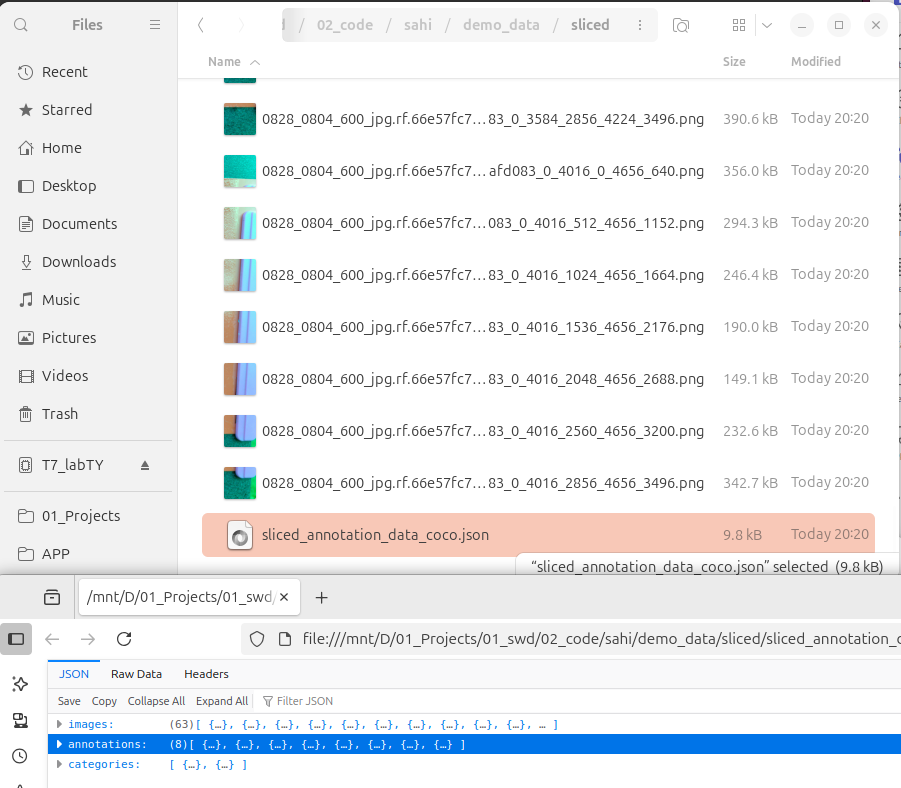

In [ ]:
coco_dict, coco_path = slice_coco(
    coco_annotation_file_path="demo_data/_annotations.coco.json",
    image_dir="demo_data/",
    output_coco_annotation_file_name="sliced_annotation_data",
    ignore_negative_samples=False,
    output_dir="demo_data/sliced/",
    slice_height=640,
    slice_width=640,
    overlap_height_ratio=0.2,
    overlap_width_ratio=0.2,
    min_area_ratio=0.1,
    verbose=True
)

  0%|          | 0/1 [00:00<?, ?it/s]2025-08-26 20:20:00,397 - sahi - INFO - image.shape: (4656, 3496) (slicing.py:325)
2025-08-26 20:20:00,558 - sahi - INFO - Num slices: 63 slice_height: 640 slice_width: 640 (slicing.py:399)
100%|██████████| 1/1 [00:00<00:00,  4.12it/s]
2025-08-26 20:20:00,577 - sahi - INFO - sliced image path: demo_data/sliced/0828_0804_600_jpg.rf.66e57fc7553397a4584277dd90afd083_0_0_512_640_1152.png (slicing.py:317)


2025-08-26 20:20:00,600 - sahi - INFO - sliced image path: demo_data/sliced/0828_0804_600_jpg.rf.66e57fc7553397a4584277dd90afd083_0_0_0_640_640.png (slicing.py:317)
2025-08-26 20:20:00,611 - sahi - INFO - sliced image path: demo_data/sliced/0828_0804_600_jpg.rf.66e57fc7553397a4584277dd90afd083_0_0_1024_640_1664.png (slicing.py:317)
2025-08-26 20:20:00,632 - sahi - INFO - sliced image path: demo_data/sliced/0828_0804_600_jpg.rf.66e57fc7553397a4584277dd90afd083_0_4016_512_4656_1152.png (slicing.py:317)
2025-08-26 20:20:00,636 - sahi - INFO - sliced image path: demo_data/sliced/0828_0804_600_jpg.rf.66e57fc7553397a4584277dd90afd083_0_1024_512_1664_1152.png (slicing.py:317)
2025-08-26 20:20:00,646 - sahi - INFO - sliced image path: demo_data/sliced/0828_0804_600_jpg.rf.66e57fc7553397a4584277dd90afd083_0_1024_0_1664_640.png (slicing.py:317)
2025-08-26 20:20:00,650 - sahi - INFO - sliced image path: demo_data/sliced/0828_0804_600_jpg.rf.66e57fc7553397a4584277dd90afd083_0_512_0_1152_640.png (s

## 展示切好的图片

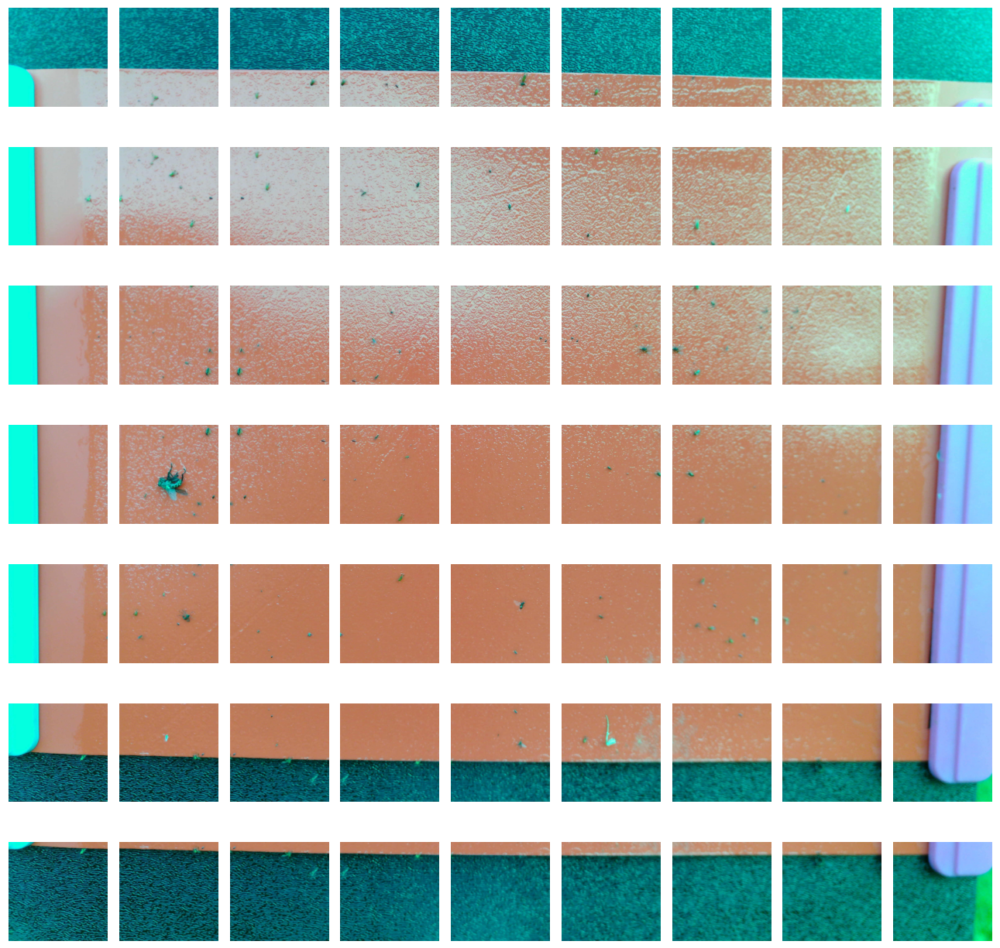

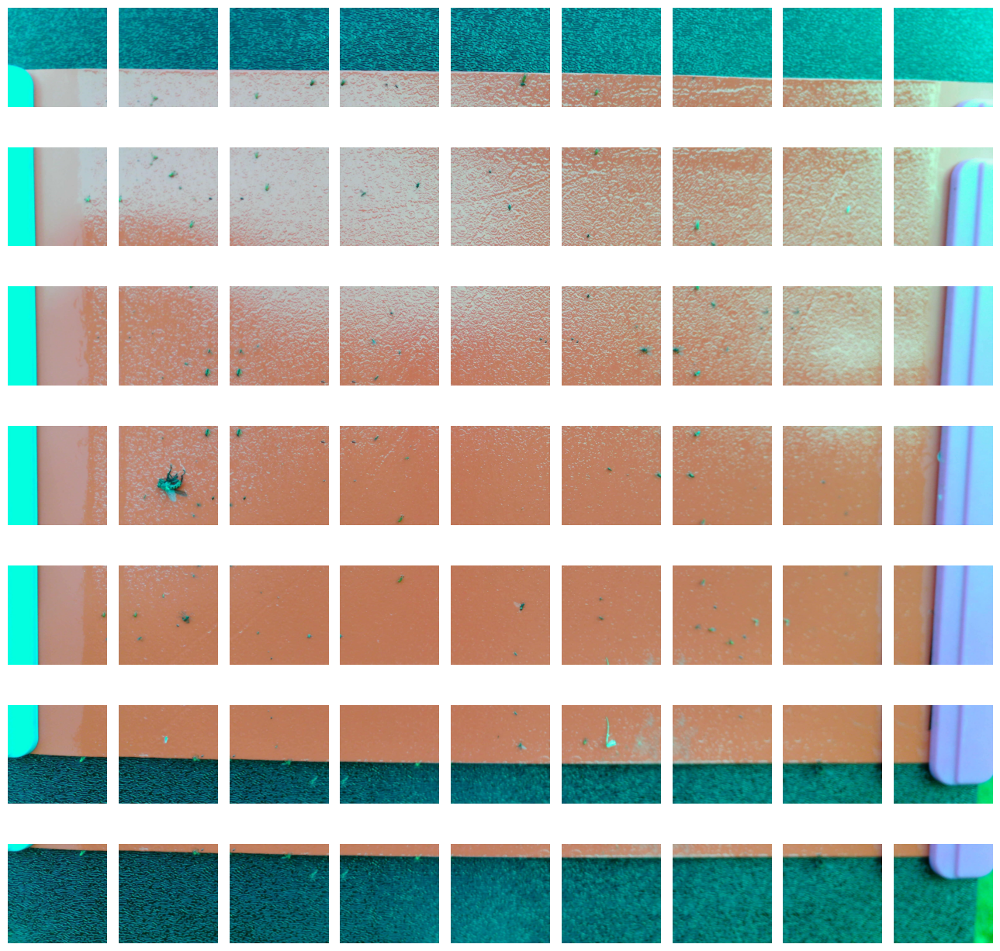

In [6]:
row = 7
col = 9
f, axarr = plt.subplots(row, col, figsize=(13,13))
img_ind = 0
for ind1 in range(row):
    for ind2 in range(col):
        img = Image.open("demo_data/sliced/" + coco_dict["images"][img_ind]["file_name"])
        axarr[ind1, ind2].imshow(img)
        axarr[ind1, ind2].axis('off')
        img_ind += 1
plt.tight_layout()
plt.show()

## 展示切好的图片+标记， 未处理重叠部分

效果展示：

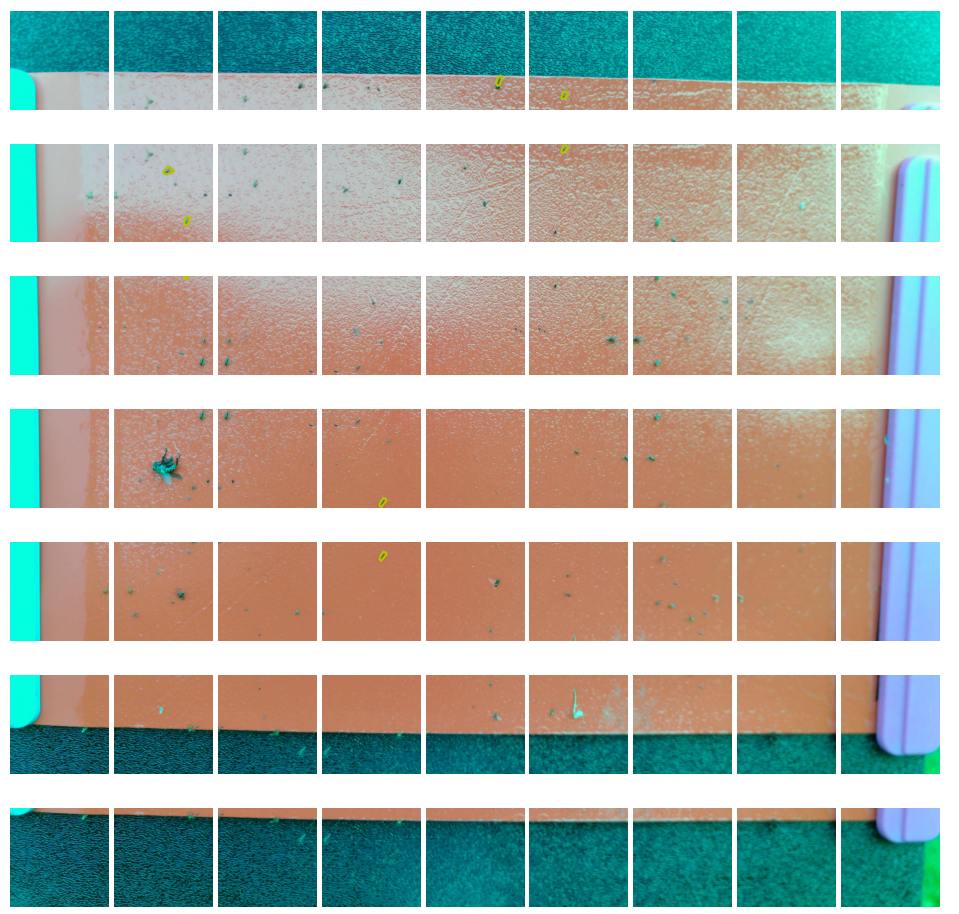

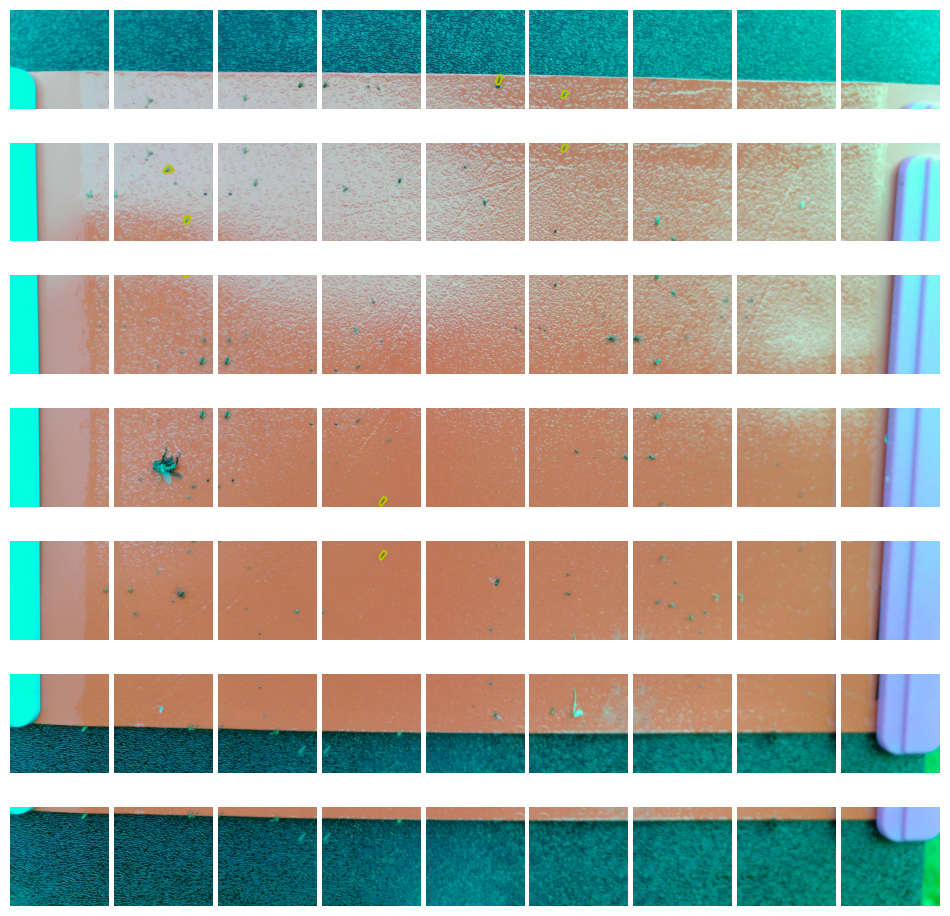

In [11]:
from collections import defaultdict
import os
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon

# 1) 先按 image_id 建索引
anns_by_img = defaultdict(list)
for ann in coco_dict["annotations"]:
    anns_by_img[ann["image_id"]].append(ann)

# 2) 合理的画布大小（示例）
f, axarr = plt.subplots(row, col, figsize=(12, 12), constrained_layout=False)

img_ind = 0
for r in range(row):
    for c in range(col):
        if img_ind >= len(coco_dict["images"]):
            axarr[r, c].axis('off')
            continue

        iminfo = coco_dict["images"][img_ind]
        img_path = os.path.join("demo_data/sliced", iminfo["file_name"])
        img = Image.open(img_path).convert("RGB")  # 不要动辄 RGBA
        ax = axarr[r, c]
        ax.imshow(img)
        ax.axis('off')

        # 3) 只画与该图相关的标注（O(相关标注数)）
        for ann in anns_by_img[iminfo["id"]]:
            if "segmentation" not in ann:
                continue
            for seg in ann["segmentation"]:
                xy = [(int(seg[i]), int(seg[i+1])) for i in range(0, len(seg), 2)]
                # 用 matplotlib Polygon（通常更快）
                poly = Polygon(xy, fill=False, linewidth=1.5, edgecolor='y')
                ax.add_patch(poly)

        img_ind += 1

# 4) 简化布局；如非必要，不用 tight_layout（在大量子图时很慢）
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()
